# Base Model

This ipynb file contains the methodology behind the baseball simulator model.

GitHub: https://github.com/dgrifka/baseball_game_simulator

Twitter: https://x.com/mlb_simulator

We are building a machine learning model that uses all batted ball data from the 2023 and 2024 seasons to predict baseball hit outcomes (out, single, double, triple, or home run) based on launch speed, launch angle, and the stadium where the hit occurred. It uses a Gradient Boosting Classifier wrapped in a scikit-learn pipeline that handles both numeric and categorical data preprocessing. We then save the trained pipeline to a pickle file, which we upload to the main GitHub repo.

In [1]:
!pip install pymysql

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 1.6 MB/s eta 0:00:00


In [2]:
# Standard library imports
import datetime
import itertools
import json
import pickle
import time

# Data manipulation and analysis
import numpy as np
import pandas as pd
from pandas import json_normalize
pd.set_option('display.max_columns', None)

# Database
import pymysql
from sqlalchemy import create_engine

# Machine learning
from sklearn.compose import make_column_transformer
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import binned_statistic_2d

# HTTP requests
import requests

I've saved the batted ball data in a private database, which we load here

**Note: I've removed the database credentials for security purposes.**

First, we obtain the stadiums that we have in our database

In [4]:
table_name = 'teams'

# Read the data from the 'teams' table
query = f"SELECT * FROM {table_name}"
teams = pd.read_sql_query(query, engine)

stadiums = teams['venue_name'].unique()
# Join stadiums list to strings separated by commas
stadiums_str = "', '".join(stadiums)
print(stadiums_str)

Angel Stadium', 'Chase Field', 'Oriole Park at Camden Yards', 'Fenway Park', 'Wrigley Field', 'Great American Ball Park', 'Progressive Field', 'Coors Field', 'Comerica Park', 'Minute Maid Park', 'Kauffman Stadium', 'Dodger Stadium', 'Nationals Park', 'Citi Field', 'Oakland Coliseum', 'PNC Park', 'Petco Park', 'T-Mobile Park', 'Oracle Park', 'Busch Stadium', 'Tropicana Field', 'Globe Life Field', 'Rogers Centre', 'Target Field', 'Citizens Bank Park', 'Truist Park', 'Guaranteed Rate Field', 'loanDepot park', 'Yankee Stadium', 'American Family Field


Then, we pull regular season games played at the above stadiums.

In [5]:
table_name = 'games'

# Read the data from the 'games' table, excluding 'Spring Training' and 'Exhibition' games
query = f"SELECT * FROM {table_name} WHERE seriesDescription NOT IN ('Spring Training', 'Exhibition') AND venue_name in ('{stadiums_str}')"
games = pd.read_sql_query(query, engine)

# Get the unique 'gamePk' values from the filtered 'games' table
game_pks = games['gamePk'].unique()

games.head()

,gameDate,gameNumber,gamePk,gamesInSeries,last_updated_date,season,seriesDescription,sport_id,status_abstractGameState,teams_away_isWinner,teams_away_leagueRecord_losses,teams_away_leagueRecord_pct,teams_away_leagueRecord_wins,teams_away_score,teams_away_seriesNumber,teams_away_team_id,teams_home_isWinner,teams_home_leagueRecord_losses,teams_home_leagueRecord_pct,teams_home_leagueRecord_wins,teams_home_score,teams_home_seriesNumber,teams_home_team_id,venue_id,venue_name
0,2024-08-31 22:10:00,1,746590,3.0,2024-09-24 01:49:33,2024,Regular Season,1,Final,True,72,0.467,63,3.0,44.0,134,False,59,0.566,77,0.0,44.0,114,5,Progressive Field
1,2024-09-19 18:35:00,1,744962,3.0,2024-09-24 01:49:33,2024,Regular Season,1,Final,True,80,0.477,73,4.0,49.0,141,False,80,0.477,73,0.0,49.0,140,5325,Globe Life Field
2,2024-04-25 17:10:00,1,746724,4.0,2024-05-15 18:47:48,2024,Regular Season,1,Final,True,10,0.615,16,5.0,8.0,143,False,11,0.560,14,0.0,8.0,113,2602,Great American Ball Park
3,2024-07-24 00:40:00,1,746524,3.0,2024-07-26 15:57:15,2024,Regular Season,1,Final,True,46,0.540,54,6.0,33.0,111,False,65,0.363,37,0.0,33.0,115,19,Coors Field
4,2023-08-11 23:10:00,1,717040,4.0,2024-05-15 19:04:23,2023,Regular Season,1,Final,True,41,0.640,73,7.0,38.0,144,False,63,0.452,52,0.0,38.0,121,3289,Citi Field


To get all batted ball data from the database, we break it into chunks to prevent Colab from crashing.

In [20]:
table_name = 'game_info'
chunk_size = 20000

# Read the data from the 'game_info' table in chunks, filtering by the unique 'gamePk' values
# and excluding rows where 'hitData_launchSpeed' and 'hitData_launchAngle' are null
chunks = []
columns = ['playId', 'gamePk', 'eventType', 'hitData_launchSpeed', 'hitData_launchAngle']
for chunk in pd.read_sql_table(table_name, engine, chunksize=chunk_size, columns=columns):
    chunk = chunk[(chunk['gamePk'].isin(game_pks)) & (pd.notnull(chunk['hitData_launchSpeed'])) & (pd.notnull(chunk['hitData_launchAngle']))]
    chunks.append(chunk)

# Concatenate the chunks into a single DataFrame
game_info = pd.concat(chunks, ignore_index=True)

# Group by 'playId', 'gamePk', 'eventType' and calculate the average of 'hitData_launchSpeed' and 'hitData_launchAngle'
# This is to ensure we don't have any duplicate plays
game_info_grouped = game_info.groupby(['playId', 'gamePk', 'eventType']).agg({
    'hitData_launchSpeed': 'mean',
    'hitData_launchAngle': 'mean'
}).reset_index()

# Then, filter to the last record of this occurrence, since each playId includes other irrelevant information, such as stolen bases, etc.
game_info_grouped = game_info_grouped.drop_duplicates(subset="playId", keep="last")
game_info_grouped.head()

,playId,gamePk,eventType,hitData_launchSpeed,hitData_launchAngle
0,00001ae9-c451-476f-8619-778d02ec19d5,745871,field_out,96.9,-2.0
1,000111b7-5c6b-49b2-a828-e3aea4020aac,718028,field_out,100.0,-33.0
2,0001b5d6-10a9-4e67-a7a4-7471dc734e4b,746912,single,106.0,-4.0
3,0001b643-8a44-41e0-aef1-4dffecc9c228,716405,single,95.0,4.0
4,0001c67c-853e-444f-af5c-24f9e35c0262,745419,field_out,96.5,43.0


Then, we feature engineer the eventType values and merge the stadium information.

In [7]:
filtered_game_info = game_info_grouped.copy()
filtered_game_info = filtered_game_info[['gamePk', 'eventType', 'hitData_launchSpeed', 'hitData_launchAngle']]

# Replace event types that are not 'single', 'double', 'triple', or 'home_run' with 'out'
filtered_game_info['eventType'] = filtered_game_info['eventType'].apply(lambda x: x if x in ['single', 'double', 'triple', 'home_run'] else 'out')

# Remove rows where 'hitData_launchSpeed' and 'hitData_launchAngle' are NA
filtered_game_info = filtered_game_info[~filtered_game_info[['hitData_launchSpeed', 'hitData_launchAngle']].isna().any(axis=1)]

filtered_game_info.reset_index(drop=True, inplace=True)
## Include venue information, since this affects batted ball data
filtered_game_info = pd.merge(filtered_game_info, games[['gamePk', 'venue_name']], on = ['gamePk'], how = 'left')
filtered_game_info.head()

,gamePk,eventType,hitData_launchSpeed,hitData_launchAngle,venue_name
0,745871,out,96.9,-2.0,Target Field
1,718028,out,100.0,-33.0,American Family Field
2,746912,single,106.0,-4.0,Fenway Park
3,716405,single,95.0,4.0,Coors Field
4,745419,out,96.5,43.0,Petco Park


Here is where we fit and train the model, which can correctly predict the eventType 77% of the time. I tried several different models and various hyparameter tuning methods, but it's important that we keep the model nimble enough that it can be loaded and deployed via GitHub.

In [8]:
# Define the event type mapping
event_type_mapping = {
    'out': 0,
    'single': 1,
    'double': 2,
    'triple': 3,
    'home_run': 4
}

# Map event types to numerical values
filtered_game_info['eventType_numeric'] = filtered_game_info['eventType'].map(event_type_mapping)

# Prepare features and target
X = filtered_game_info[['hitData_launchSpeed', 'hitData_launchAngle', 'venue_name']]
y = filtered_game_info['eventType_numeric']

# Convert column names to strings
X.columns = [str(col) for col in X.columns]

# Define feature groups
numeric_features = ['hitData_launchSpeed', 'hitData_launchAngle']
categorical_features = ['venue_name']

# Create preprocessor
preprocessor = make_column_transformer(
    (StandardScaler(), numeric_features),
    (OneHotEncoder(handle_unknown='ignore'), categorical_features),
    remainder='passthrough'
)

# Create pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', GradientBoostingClassifier(n_estimators=100, max_depth=8, learning_rate=0.1, random_state=42))
])

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the pipeline
pipeline.fit(X_train, y_train)

# Make predictions
y_pred = pipeline.predict(X_test)

# Evaluate the model's performance
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted', zero_division=1)
recall = recall_score(y_test, y_pred, average='weighted', zero_division=1)
f1 = f1_score(y_test, y_pred, average='weighted', zero_division=1)

print("GB Classifier Results:")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

# Save the entire pipeline in a single pickle file
with open('gb_classifier_pipeline.pkl', 'wb') as file:
    pickle.dump(pipeline, file)

# Feature importance analysis
feature_names = pipeline.named_steps['preprocessor'].get_feature_names_out()
feature_importance = pipeline.named_steps['classifier'].feature_importances_

# Sort feature importances in descending order
indices = np.argsort(feature_importance)[::-1]

print("\nFeature importance ranking:")
for f in range(len(feature_importance)):
    print("%d. %s (%f)" % (f + 1, feature_names[indices[f]], feature_importance[indices[f]]))

GB Classifier Results:
Accuracy: 0.7714979402575176
Precision: 0.7463866308883197
Recall: 0.7714979402575176
F1-score: 0.7521173412687017

Feature importance ranking:
1. standardscaler__hitData_launchAngle (0.576933)
2. standardscaler__hitData_launchSpeed (0.385052)
3. onehotencoder__venue_name_Fenway Park (0.001855)
4. onehotencoder__venue_name_Great American Ball Park (0.001677)
5. onehotencoder__venue_name_Yankee Stadium (0.001663)
6. onehotencoder__venue_name_Coors Field (0.001589)
7. onehotencoder__venue_name_Minute Maid Park (0.001505)
8. onehotencoder__venue_name_Busch Stadium (0.001433)
9. onehotencoder__venue_name_Progressive Field (0.001375)
10. onehotencoder__venue_name_Oriole Park at Camden Yards (0.001373)
11. onehotencoder__venue_name_Guaranteed Rate Field (0.001297)
12. onehotencoder__venue_name_Citizens Bank Park (0.001268)
13. onehotencoder__venue_name_American Family Field (0.001251)
14. onehotencoder__venue_name_Target Field (0.001246)
15. onehotencoder__venue_name_O

Then, we download the pipeline, so we can upload to GitHub.

In [9]:
from google.colab import files
files.download('gb_classifier_pipeline.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In addition to correctly predicting the most likely outcome, the more important part of this model is that it can assign probabilities to various outcomes, which we then loop through in the simulations.

In [12]:
# Load the saved pipeline
with open('gb_classifier_pipeline.pkl', 'rb') as file:
    pipeline = pickle.load(file)

# Define the mapping of numerical values back to event types
numeric_event_mapping = {
    0: 'out',
    1: 'single',
    2: 'double',
    3: 'triple',
    4: 'home_run'
}

# Define the list of venue names
venue_names = stadiums

# Get the unique values of 'hitData_launchSpeed' and 'hitData_launchAngle'
launch_speeds = filtered_game_info['hitData_launchSpeed'].unique()
launch_angles = filtered_game_info['hitData_launchAngle'].unique()

# Create lists to store the values
speed_list = []
angle_list = []
venue_list = []
event_type_list = []
prob_out_list = []
prob_single_list = []
prob_double_list = []
prob_triple_list = []
prob_home_run_list = []

# Create a list of all possible combinations of launch speed, launch angle, and venue name
new_examples = []
for speed, angle, venue in itertools.product(launch_speeds, launch_angles, venue_names):
    example = {
        'hitData_launchSpeed': speed,
        'hitData_launchAngle': angle,
        'venue_name': venue
    }
    new_examples.append(example)

# Convert the new examples to a DataFrame
new_data = pd.DataFrame(new_examples)

# Make predictions and get predicted probabilities using the pipeline
# The pipeline will handle the preprocessing internally
predictions = pipeline.predict(new_data)
probabilities = pipeline.predict_proba(new_data)

# Append the values to the lists
for example, prediction, probs in zip(new_examples, predictions, probabilities):
    speed_list.append(example['hitData_launchSpeed'])
    angle_list.append(example['hitData_launchAngle'])
    venue_list.append(example['venue_name'])
    event_type_list.append(numeric_event_mapping[prediction])
    prob_out_list.append(probs[0])
    prob_single_list.append(probs[1])
    prob_double_list.append(probs[2])
    prob_triple_list.append(probs[3])
    prob_home_run_list.append(probs[4])

# Create a DataFrame with the specified columns
result_df = pd.DataFrame({
    'hitData_launchSpeed': speed_list,
    'hitData_launchAngle': angle_list,
    'venue_name': venue_list,
    'event_type': event_type_list,
    'prob_out': prob_out_list,
    'prob_single': prob_single_list,
    'prob_double': prob_double_list,
    'prob_triple': prob_triple_list,
    'prob_home_run': prob_home_run_list
})

result_df.head()

,hitData_launchSpeed,hitData_launchAngle,venue_name,event_type,prob_out,prob_single,prob_double,prob_triple,prob_home_run
0,96.9,-2.0,Angel Stadium,out,0.536709,0.436354,0.025621,0.001163,0.000154
1,96.9,-2.0,Chase Field,out,0.638118,0.316110,0.037067,0.008522,0.000183
2,96.9,-2.0,Oriole Park at Camden Yards,out,0.598835,0.378510,0.021347,0.001148,0.000159
3,96.9,-2.0,Fenway Park,out,0.684138,0.301711,0.012645,0.001312,0.000193
4,96.9,-2.0,Wrigley Field,out,0.672181,0.299417,0.027230,0.000995,0.000177


Then, we create a function that can plot the most likely eventType at each stadium, given different LA/EV values. It's import to note this is less important than the probabilities it assigns to all events, not just the most likely. This is just a test to confirm the efficacy of the model.

In [13]:
def plot_event_distribution_by_venue(result_df):
    """
    Creates scatter plots of event distribution for each unique venue.

    Args:
        result_df (DataFrame): The input DataFrame containing the batted ball data
    """
    # Create a dictionary mapping event types to colors
    color_mapping = {
        'out': 'red',
        'single': 'blue',
        'double': 'green',
        'triple': 'orange',
        'home_run': 'purple'
    }

    # Get unique venues
    unique_venues = result_df['venue_name'].unique()

    # Create a plot for each venue
    for venue in unique_venues:
        # Filter data for current venue
        venue_data = result_df[result_df['venue_name'] == venue].copy()

        # Create a figure and axis
        fig, ax = plt.subplots(figsize=(8, 6))

        # Iterate over each unique event type and plot the corresponding data points
        for event_type in venue_data['event_type'].unique():
            event_data = venue_data[venue_data['event_type'] == event_type]
            probabilities = event_data[f'prob_{event_type.replace("-", "_")}']
            scatter = ax.scatter(event_data['hitData_launchSpeed'],
                               event_data['hitData_launchAngle'],
                               color=color_mapping[event_type],
                               label=f"{event_type} (n={len(event_data)})",
                               alpha=probabilities,
                               s=100)

        # Set the labels and title
        ax.set_xlabel('Launch Speed (mph)', fontsize=12)
        ax.set_ylabel('Launch Angle (degrees)', fontsize=12)
        ax.set_title(f'Event Distribution at {venue}',
                    fontsize=14, pad=20)

        # Add gridlines
        ax.grid(True, linestyle='--', alpha=0.7)

        # Customize the legend
        legend = ax.legend(title="Event Types",
                         bbox_to_anchor=(1.05, 1),
                         loc='upper left',
                         fontsize=10)
        legend.get_title().set_fontsize(12)

        # Adjust layout to prevent label cutoff
        plt.tight_layout()

        # Display the plot
        plt.show()

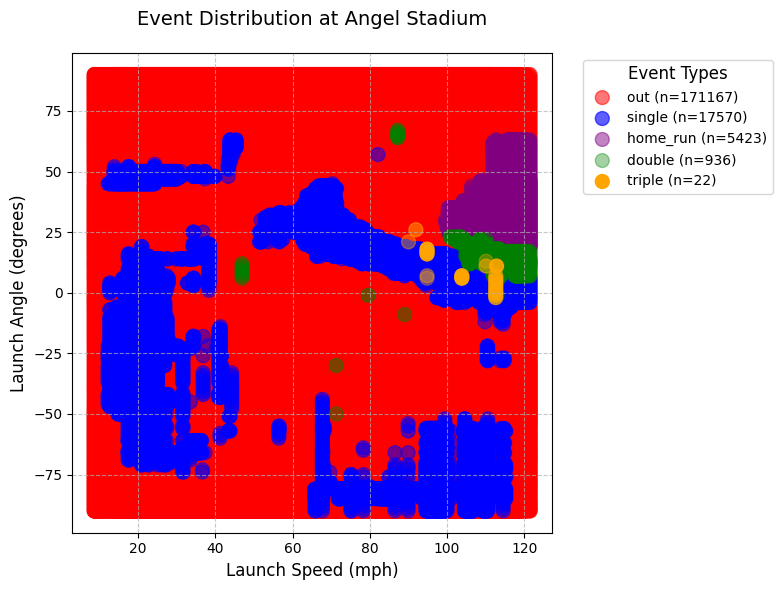

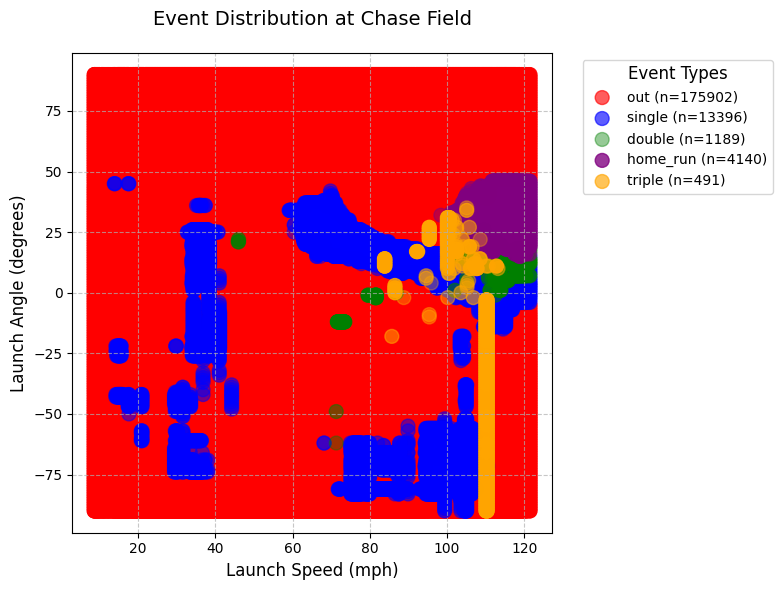

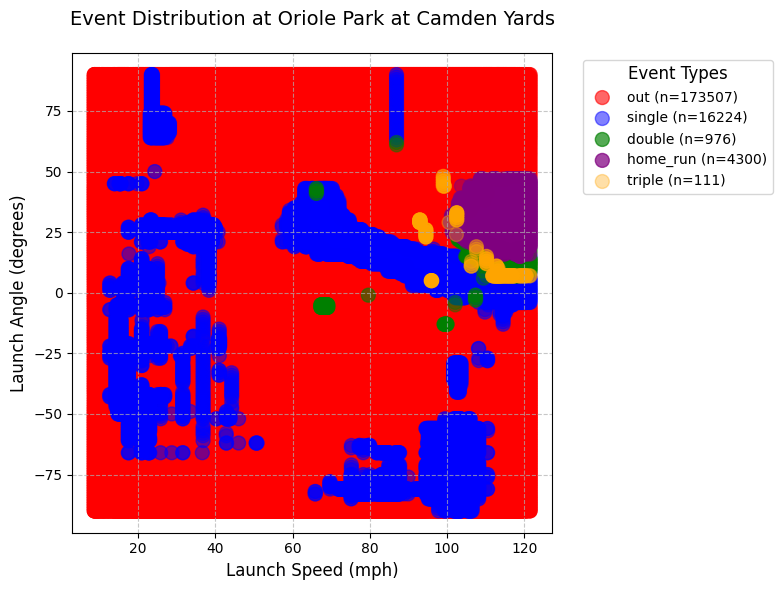

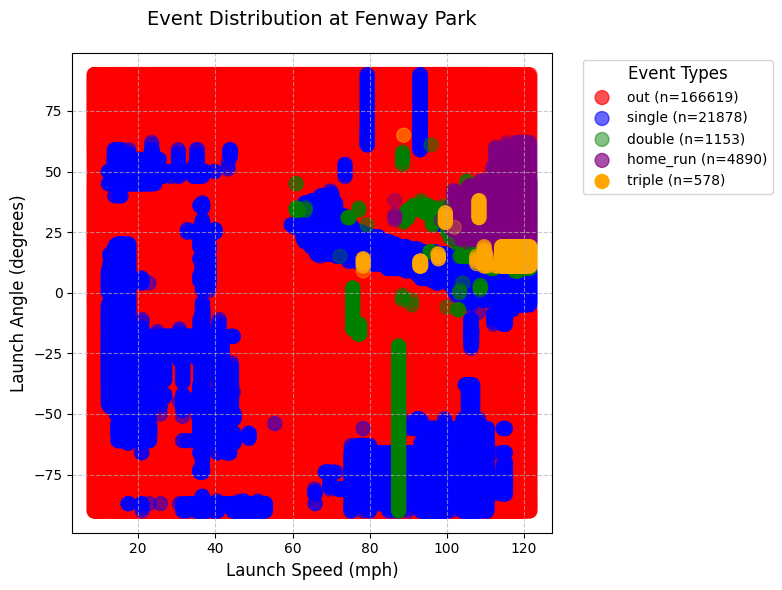

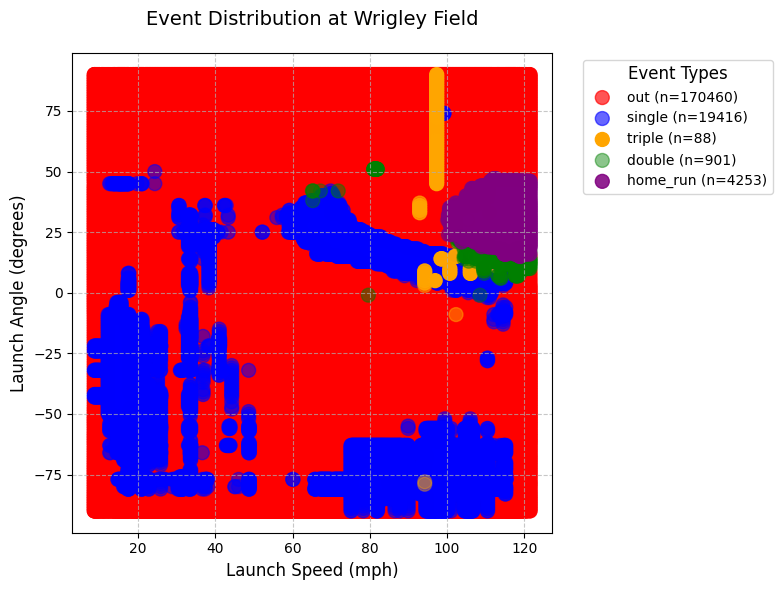

...

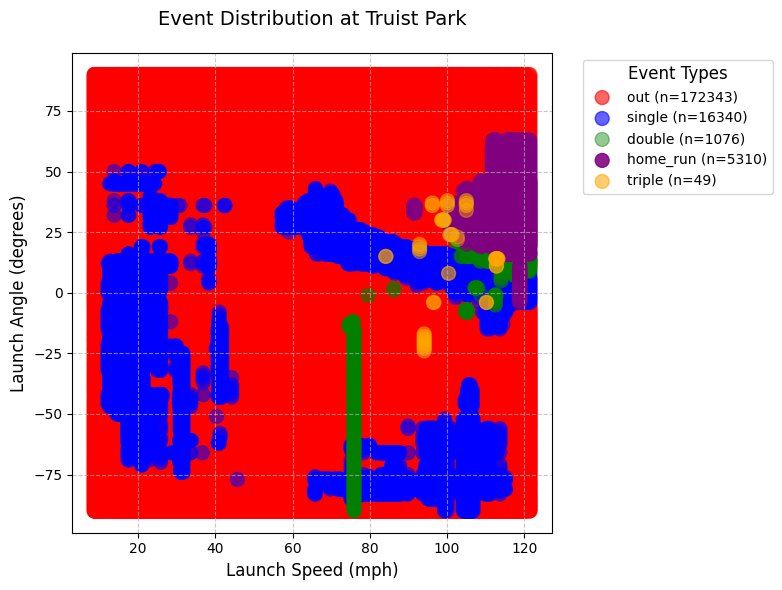

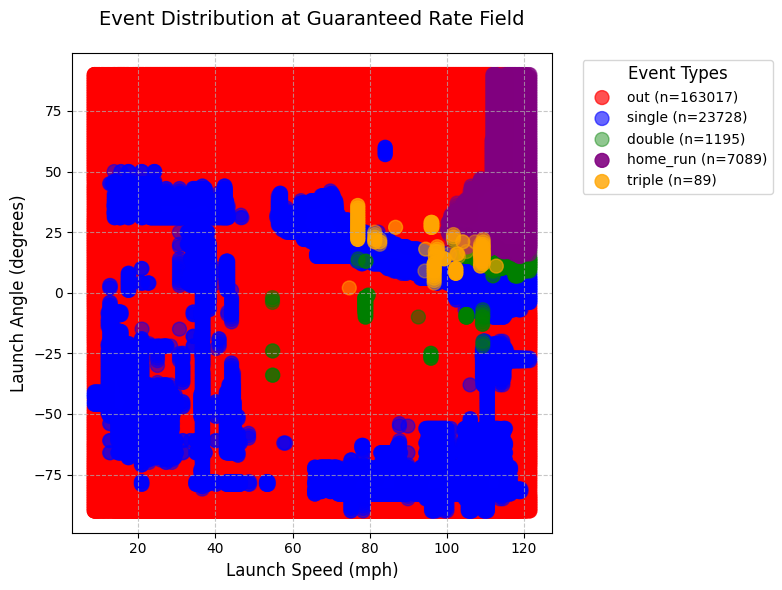

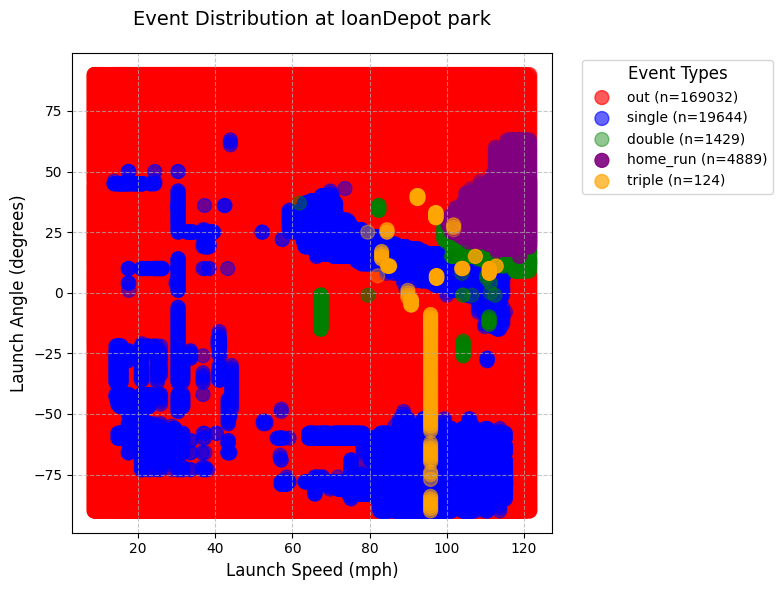

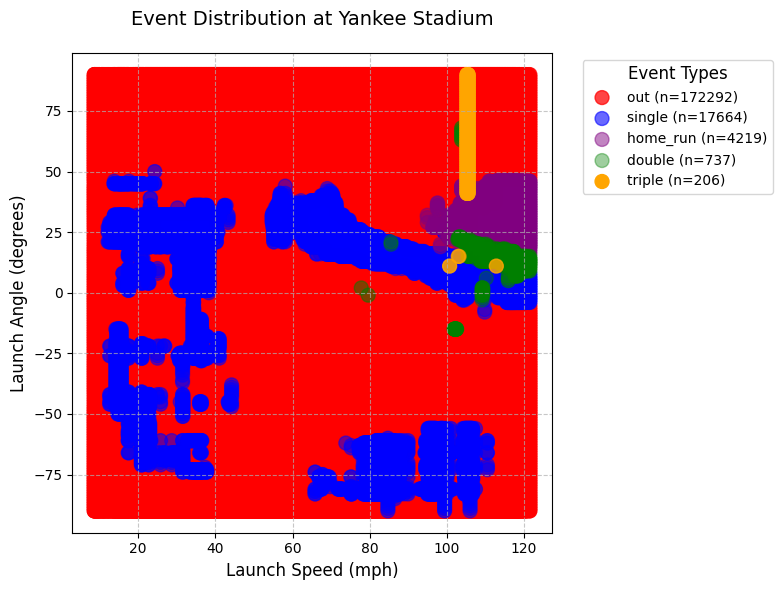

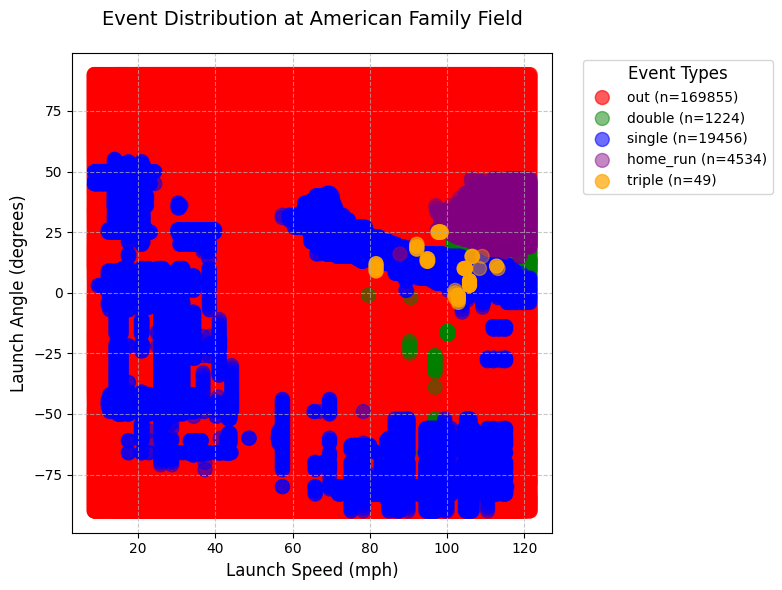

In [14]:
plot_event_distribution_by_venue(result_df)

Here we plot "estimated bases", which multiplies the probabilities by the number of bases for each event, then sums them together. This is a more intuitive way to test the model at each stadium, but the predictions pass the sniff test.

In [15]:
def calculate_expected_bases(row):
    """Calculate expected bases for each row based on probabilities"""
    return (row['prob_out'] * 0 +
            row['prob_single'] * 1 +
            row['prob_double'] * 2 +
            row['prob_triple'] * 3 +
            row['prob_home_run'] * 4)

def plot_expected_bases_by_venue(result_df):
    """
    Creates scatter plots of expected bases for each unique venue.

    Args:
        result_df (DataFrame): The input DataFrame containing the baseball data
    """
    # Calculate expected bases for each row
    plot_data = result_df.copy()
    plot_data['expected_bases'] = plot_data.apply(calculate_expected_bases, axis=1)

    # Get unique venues
    unique_venues = plot_data['venue_name'].unique()

    # Create a plot for each venue
    for venue in unique_venues:
        # Filter data for current venue
        venue_data = plot_data[plot_data['venue_name'] == venue].copy()

        # Create figure
        fig, ax = plt.subplots(figsize=(8,6))

        # Create scatter plot
        scatter = ax.scatter(venue_data['hitData_launchSpeed'],
                           venue_data['hitData_launchAngle'],
                           c=venue_data['expected_bases'],
                           cmap='viridis',
                           s=100,
                           alpha=0.6)

        # Add colorbar
        cbar = plt.colorbar(scatter, ax=ax)
        cbar.set_label('Expected Bases', fontsize=12)

        # Set labels and title
        ax.set_xlabel('Launch Speed (mph)', fontsize=12)
        ax.set_ylabel('Launch Angle (degrees)', fontsize=12)
        ax.set_title(f'Expected Bases\n{venue}',
                    fontsize=14, pad=20)

        # Add gridlines
        ax.grid(True, linestyle='--', alpha=0.7)

        # Adjust layout
        plt.tight_layout()

        # Display the plot
        plt.show()

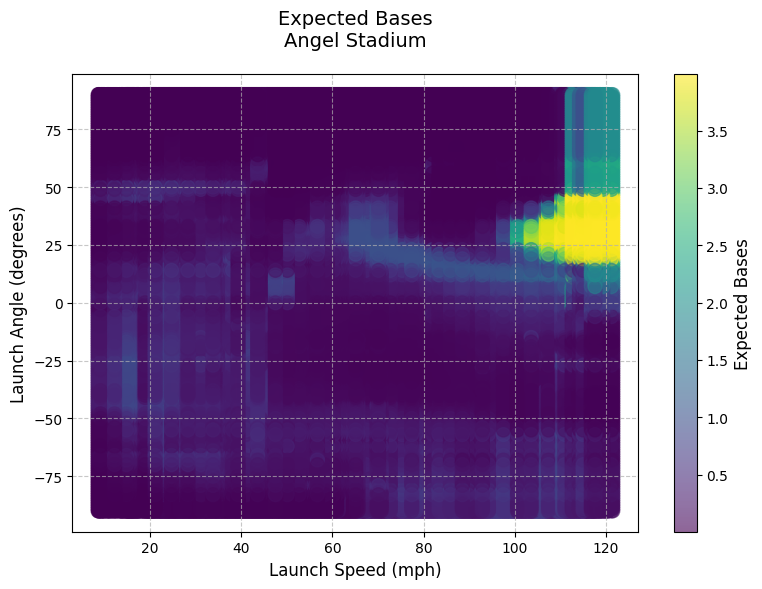

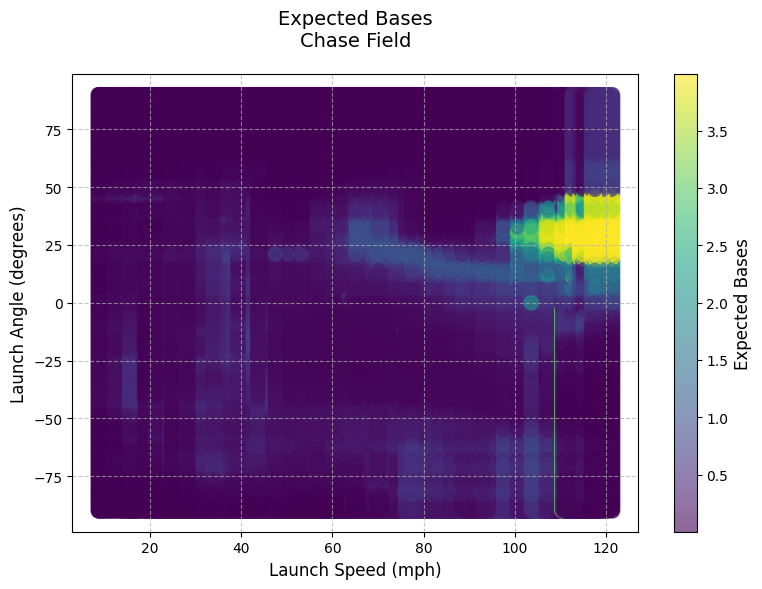

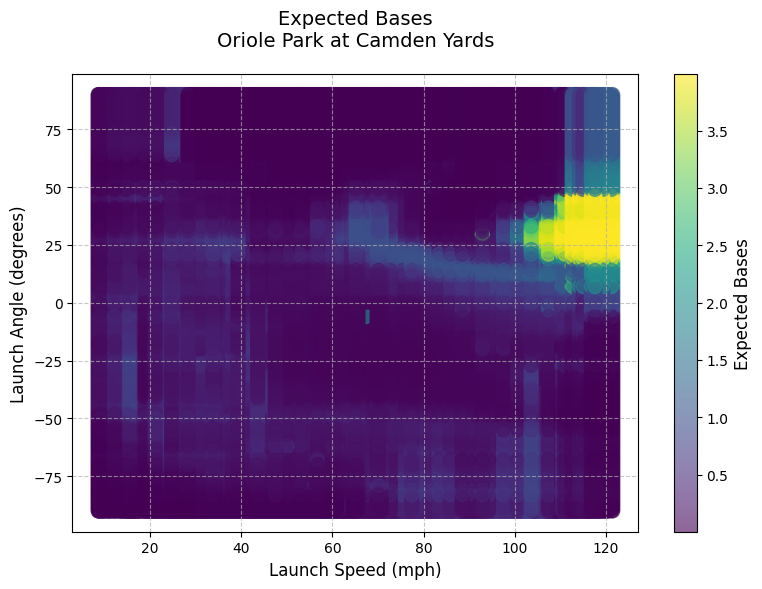

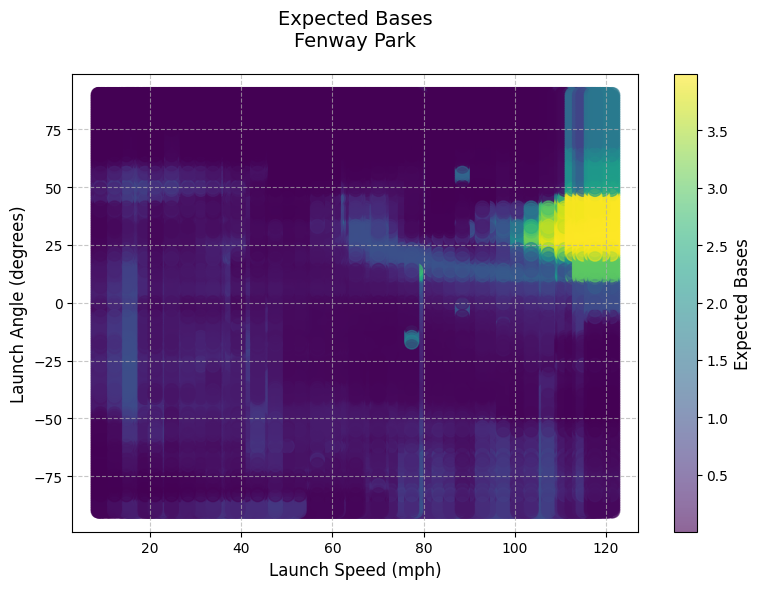

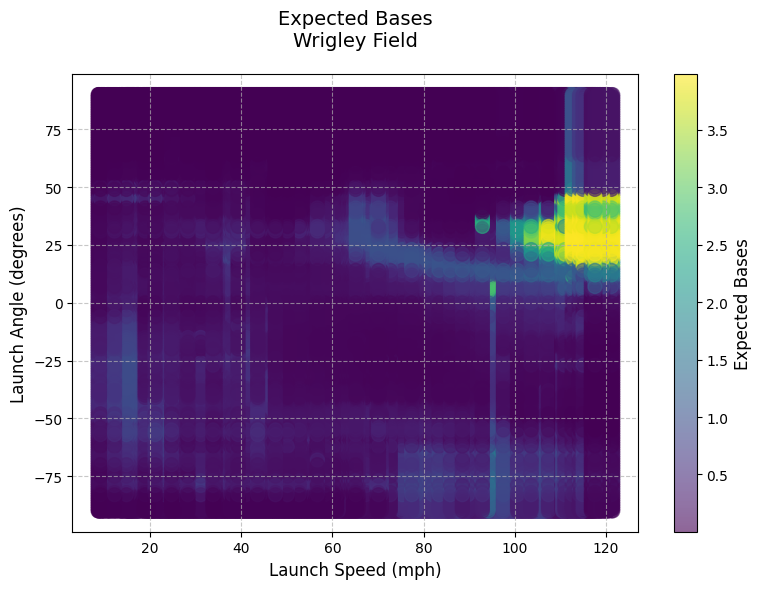

...

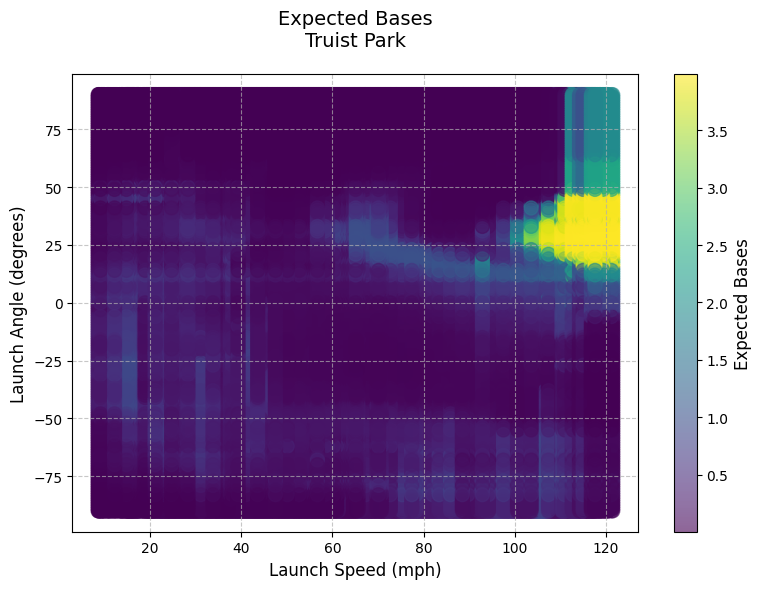

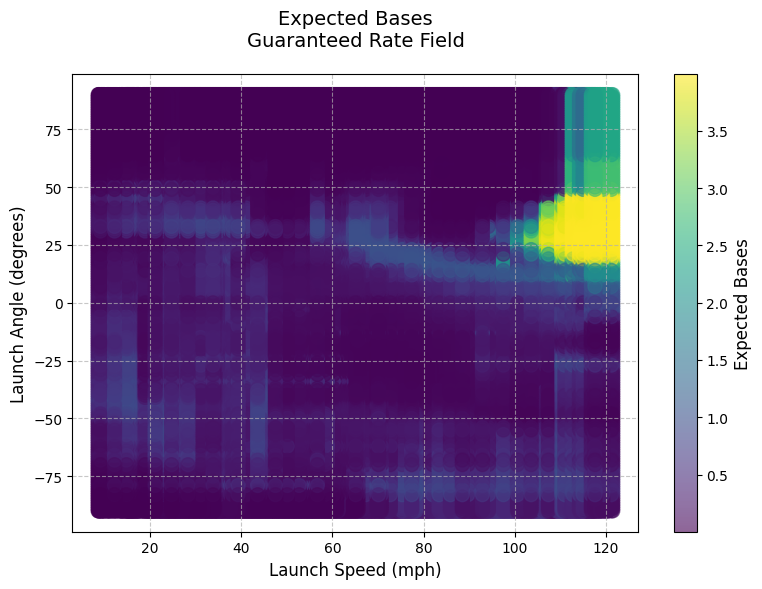

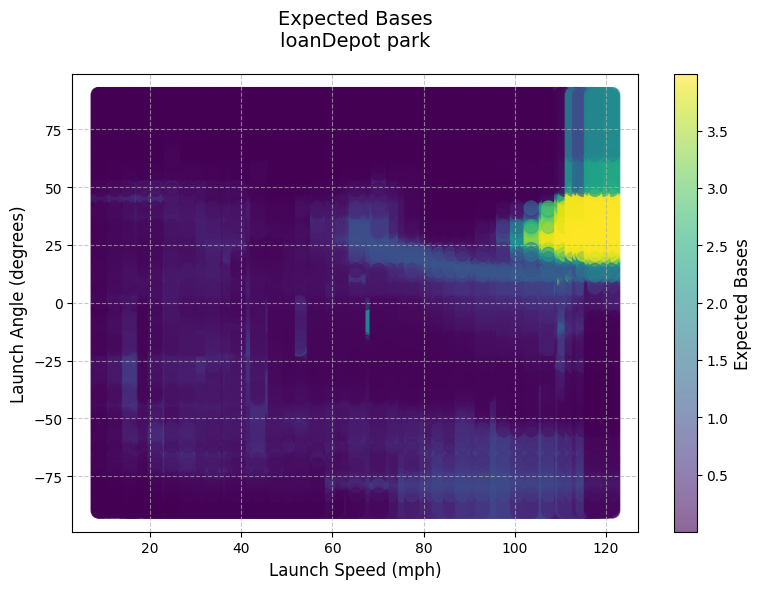

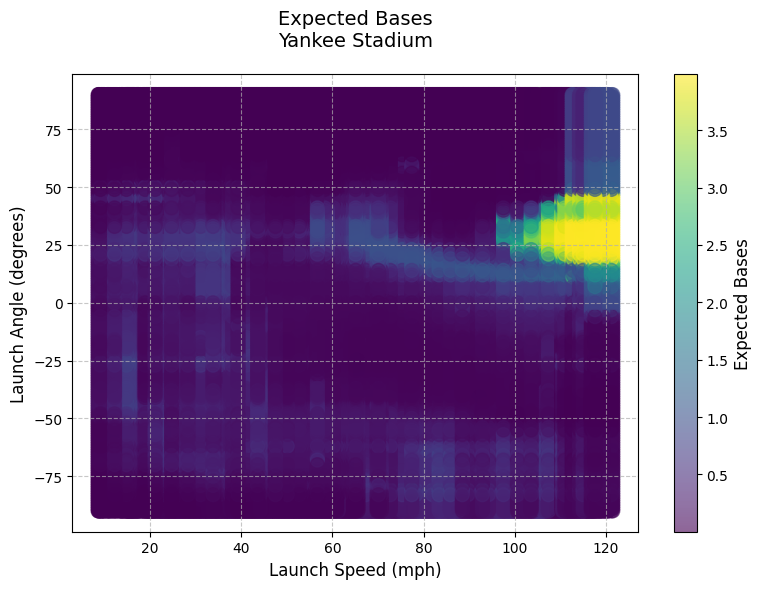

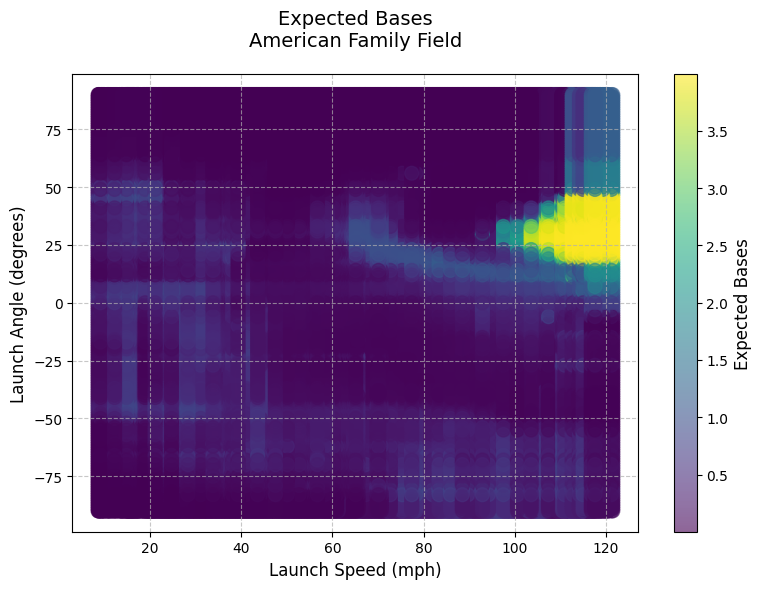

In [16]:
plot_expected_bases_by_venue(result_df)

Finally, we want to include the background contour data in the LA/EV graphs that the Twitter simulator provides.

In [17]:
all_bb = filtered_game_info.copy()

# Create a dictionary to map eventType to total bases
bases_map = {
    'out': 0,
    'single': 1,
    'double': 2,
    'triple': 3,
    'home_run': 4
}

# Create the new column using the map
all_bb['total_bases'] = all_bb['eventType'].map(bases_map)

all_bb.head(3)

,gamePk,eventType,hitData_launchSpeed,hitData_launchAngle,venue_name,eventType_numeric,total_bases
0,745871,out,96.9,-2.0,Target Field,0,0
1,718028,out,100.0,-33.0,American Family Field,0,0
2,746912,single,106.0,-4.0,Fenway Park,1,1


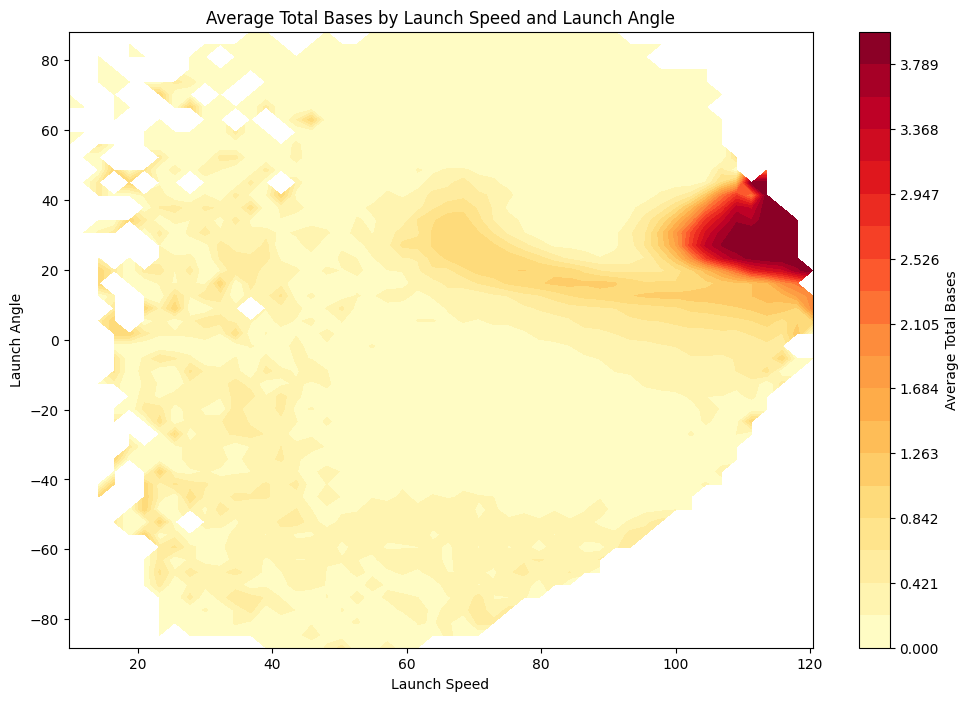

In [18]:
# Define the number of bins
num_bins = 50

# Use binned_statistic_2d to calculate mean total bases
result = binned_statistic_2d(all_bb['hitData_launchSpeed'],
                             all_bb['hitData_launchAngle'],
                             values=all_bb['total_bases'],
                             statistic='mean',
                             bins=num_bins)

# Extract the data and bin edges
heatmap = result.statistic.T
xedges, yedges = result.x_edge, result.y_edge

# Create x and y coordinates for the contour plot
x = (xedges[:-1] + xedges[1:]) / 2
y = (yedges[:-1] + yedges[1:]) / 2
X, Y = np.meshgrid(x, y)

# Create the plot
plt.figure(figsize=(12, 8))

# Fill contours with a colormap, without drawing the contour lines
contourf = plt.contourf(X, Y, heatmap, levels=np.linspace(0, 4, 20), cmap='YlOrRd')

plt.colorbar(contourf, label='Average Total Bases')

plt.xlabel('Launch Speed')
plt.ylabel('Launch Angle')
plt.title('Average Total Bases by Launch Speed and Launch Angle')

# Set background to white
plt.gca().set_facecolor('white')

plt.show()

Export this csv and upload to GitHub.

In [19]:
# Create a DataFrame with the contour data
contour_data = pd.DataFrame({
    'x': X.flatten(),
    'y': Y.flatten(),
    'z': heatmap.flatten()
})

# Save to CSV
contour_data.to_csv('contour_data.csv', index=False)